**Image Reconstruction using Matrix Factorization and Linear Regression with RFF**

Importing Libraries

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch.optim as optim
from sklearn.kernel_approximation import RBFSampler
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F
import os
from einops import rearrange
from sklearn import preprocessing
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
%config InlineBackend.figure_format = 'retina'

Processing Functions

In [2]:
def mask_image_patch(img,x,y,z,patch_size):
    img_copy = img.clone()
    for i in range(patch_size):
        for j in range(patch_size):
                for k in range(z):
                    img_copy[x+i][y+j][k] = torch.nan
    return img_copy

def mask_image_random(img,patch_size):
    img_copy = img.clone()
    n = len(img)
    m = len(img[0])
    random_i = np.random.choice(n*m,patch_size*patch_size,replace=False)
    for i in random_i:
        for j in range(3):
            img_copy[i//n][i%m] = torch.nan
    return img_copy

def create_mask(t,x,y,patch_size):
    mask = torch.full(t.shape,True)
    z = t.shape[2]
    for i in range(patch_size):
        for j in range(patch_size):
                for k in range(z):
                    mask[x+i][y+j][k] = False
    return mask

def create_coordinate_map(img):
    height, width, num_channels = img.shape
    X = torch.empty((img.shape[0],img.shape[1],2))
    
    for i in range(height):
        for j in range(width):
            X[i][j][0] = i
            X[i][j][1] = j
    return X.reshape(-1,2)

def stack_itself(t, n):
    stacked_t = t.unsqueeze(1).expand(-1, n, -1)
    return stacked_t.squeeze()

def scale(img):
    img_flatted = img.reshape(-1,1)
    scaler_X = preprocessing.MinMaxScaler().fit(img_flatted)
    img_scaled = scaler_X.transform(img_flatted).reshape(img.shape)
    img_scaled = torch.tensor(img_scaled)
    img_scaled = img_scaled.float()
    return img_scaled

def fill_patch(original_img,reconstructed_img_patch,x,y,patch_size):
    reconstructed_img = original_img.clone()
    for i in range(patch_size):
        for j in range(patch_size):
                for k in range(3):
                    reconstructed_img[x+i][y+j][k] = reconstructed_img_patch[i][j][k]
    return reconstructed_img

Creating Dataset

In [5]:
img = torchvision.io.read_image('Datasets/dog.jpg')
img_scaled = scale(img)
cropped_img = torchvision.transforms.functional.crop(img_scaled,600,800,300,300)
cropped_img = rearrange(cropped_img,'c h w -> h w c')
cropped_img = torch.tensor(cropped_img,dtype = torch.float32)
original_img = cropped_img.clone()

Matrix Factorization

In [6]:
def factorize_matrix(A, r):
    mask = ~torch.isnan(A)
    m,n = A.shape
    W = torch.rand(m,r,requires_grad=True)
    H = torch.rand(r,n,requires_grad=True)
    optimizer = optim.Adam([W,H],lr = 0.01)

    prev_loss = float('inf')  
    epsilon = 1e-6
    max_epochs = 1000

    for i in range(max_epochs):
        loss = torch.norm((A - torch.mm(W, H))[mask])
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if abs(prev_loss - loss.item()) < epsilon:
            break
        prev_loss = loss.item()

    return W, H, loss

def image_reconstrunction_matrix_factorization(masked_img,r):
    W,H,loss = factorize_matrix(rearrange(masked_img, 'h w c -> h (w c)'), r)
    reconstructed_img = torch.mm(W,H).detach()
    reconstructed_img = reconstructed_img.reshape(masked_img.shape[0],masked_img.shape[1],masked_img.shape[2])

    # reconstructed_img = scale(reconstructed_img)
    return reconstructed_img

Linear Regression + RFF

In [16]:
# LR + RFF
def plot_reconstructed_and_original_image(original_img, masked_img, reconstructed_img, title=""):
    """
    net: torch.nn.Module
    masked_img: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1])

    amasked_img0 = plt.subplot(gs[0])
    amasked_img1 = plt.subplot(gs[1])
    amasked_img2 = plt.subplot(gs[2])

    amasked_img0.imshow(reconstructed_img)
    amasked_img0.set_title("Reconstructed Image")
    
    amasked_img1.imshow(original_img.cpu())
    amasked_img1.set_title("Original Image")

    amasked_img2.imshow(masked_img.cpu())
    amasked_img2.set_title("Masked Image")

    
    # for a in [amasked_img0, amasked_img1, amasked_img2]:
    #     a.amasked_imgis("off")
    plt.show()

# def create_rff_features(masked_img, num_features, sigma):
#     from sklearn.kernel_appromasked_imgimation import RBFSampler
#     rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
#     masked_img = masked_img.cpu().numpy()
#     masked_img = rff.fit_transform(masked_img)
#     return torch.tensor(masked_img, dtype=torch.float32)

def train(net, lr, masked_img, Y, mamasked_img_epochs=2000):
    """
    net: torch.nn.Module
    lr: float
    masked_img: torch.Tensor of shape (known_pimasked_imgels, 2) // (masked_img,y)
    Y: torch.Tensor of shape (known_pimasked_imgels, 3) // (r,g,b)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    outputs = net(masked_img)
    loss = criterion(outputs, Y)
    
    prev_loss = float('inf')  
    epsilon = 1e-5
    prev_loss = float('inf')
    mamasked_img_epochs = 10000
    
    for i in range(mamasked_img_epochs):
        optimizer.zero_grad()
        outputs = net(masked_img)
        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()

        if abs(prev_loss - loss.item()) < epsilon:
            break
        prev_loss = loss.item()



class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        
    def forward(self, masked_img):
        return self.linear(masked_img)
    

def image_reconstrunction_linear_rff(masked_img,n_components,sigma = 0.008):
    
    # y = original_img.clone().reshape(-1,3)
    # masked_img = create_coordinate_map(original_img)
    # mask = ~torch.isnan(masked_img).reshape(-1,3)
    # masked_img_train = masked_img[mask[:,0:2]].reshape(-1,2)
    # y_train = y[mask].reshape(-1,3)

    # # Without RFF
    # # net = LinearModel(2,3)
    # # train(net,0.01,masked_img_train,y_train,1000)
    # # plot_reconstructed_and_original_image(original_img, net, masked_img, title="Reconstructed Image")

    # # With RFF
    # features = 15000
    # masked_img_rff = create_rff_features(masked_img, features, 0.008)
    # mask_rff = stack_itself(mask[:,0].unsqueeze(1),features)
    # masked_img_rff_train = masked_img_rff[mask_rff].reshape(-1,features)
    # y_rff_train = y[mask].reshape(-1,3)

    
    # netrff = LinearModel(masked_img_rff_train.shape[1], 3)
    # train(netrff, 0.005, masked_img_rff_train, y_rff_train, 1000)
    # height, width, num_channels = original_img.shape
    # netrff.eval()
    # with torch.no_grad():
    #     reconstructed_img = netrff(masked_img_rff).reshape(height,width,num_channels)
    # return reconstructed_img

    masked_img_flat = rearrange(original_img, 'h w c -> (h w) c').cpu().numpy()
    RFF = RBFSampler(n_components=n_components, gamma=1/(2 * sigma**2))
    masked_img_transformed = RFF.fit_transform(masked_img_flat)

    from sklearn.linear_model import LinearRegression
    linear_regressor = LinearRegression()
    linear_regressor.fit(masked_img_transformed, masked_img_flat)
    masked_img_reconstructed = linear_regressor.predict(masked_img_transformed)

    masked_img_reconstructed = masked_img_reconstructed.reshape(masked_img.shape[0], masked_img.shape[1], 3)
    return torch.tensor(masked_img_reconstructed, dtype=torch.float32).to(device)

Matrix Factorization using alternation Least Squares

Data Compression

In [8]:
def compress_patch(img_patch, r):
    W,H,loss = factorize_matrix(rearrange(img_patch, 'h w c -> h (w c)'), r)
    reconstructed_img = torch.mm(W,H).detach()
    reconstructed_img = reconstructed_img.reshape(img_patch.shape[0],img_patch.shape[1],img_patch.shape[2])

    # reconstructed_img = scale(reconstructed_img)
    return reconstructed_img

Metrics

In [9]:
def mse(original_img,reconstructed_img):
    sum = torch.tensor(0)
    for i in range(3):
        sum = sum + (nn.functional.mse_loss(original_img[:,:,i],reconstructed_img[:,:,i]))
    return sum/3

In [10]:
def psnr(original_img,reconstructed_img):
    psnr = torch.tensor(0)
    for i in range(3):
        maxi = torch.max(original_img[:,:,i])
        mse = nn.functional.mse_loss(original_img[:,:,i],reconstructed_img[:,:,i])
        psnr = psnr + (20*torch.log10(maxi/mse))
    return psnr/3

Reconstructions

Matrix Factorisation 30*30 rectangular patch


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


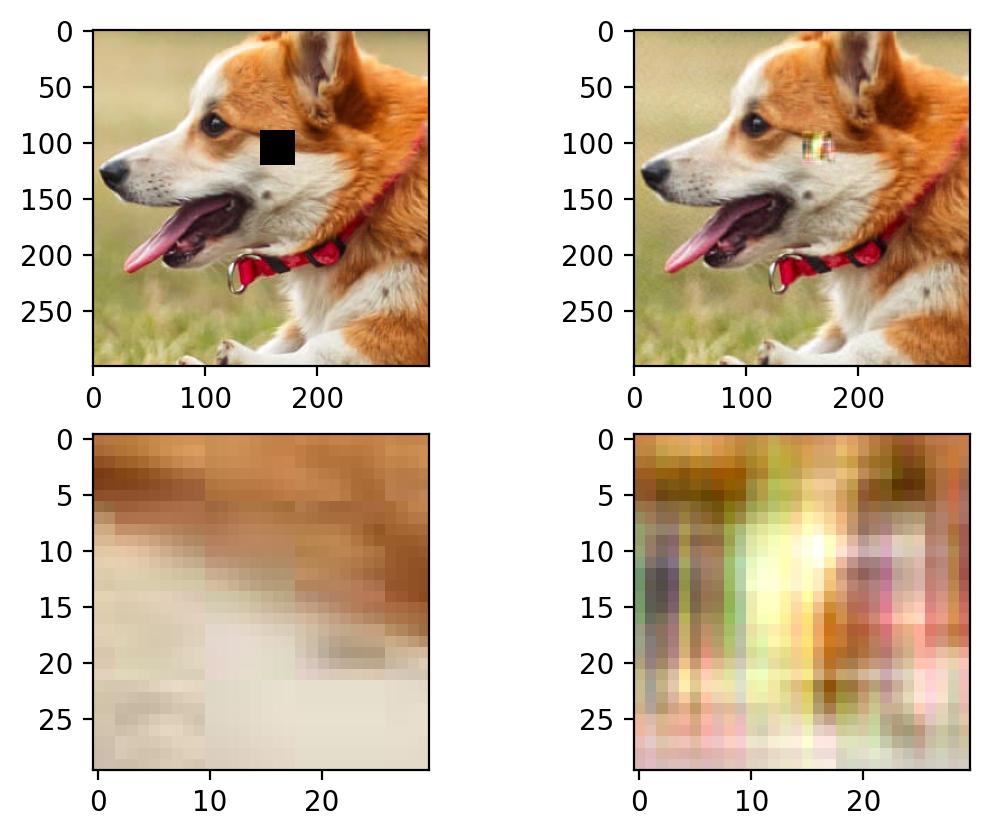

MSE for reconstruction :  tensor(0.0388)
PSNR for reconstruction :  tensor(27.1918)


In [11]:
# 1a MF
patch_size = 30
# x_y_s = [[10,10,3],[90,150,3],[140,60,3]]
x_y_s = [[90,150,3]]
# titles = ["A. 1 color patch", "B. 2 color patch", "C. 5 color patch"]
title = "Matrix Factorisation 30*30 rectangular patch"
reconstructed_images_1 = []

for i in range(len(x_y_s)):
    print(title)
    masked_img = mask_image_patch(original_img,x_y_s[i][0],x_y_s[i][1],3,patch_size)
    reconstructed_img = image_reconstrunction_matrix_factorization(masked_img,100)
    reconstructed_images_1.append(reconstructed_img)
    mask = torch.isnan(masked_img)
    original_patch = original_img[mask].reshape(patch_size,patch_size,3)
    reconstructed_patch = reconstructed_img[mask].reshape(patch_size,patch_size,3)
    fig,axs = plt.subplots(2,2)
    axs[0][0].imshow(masked_img)
    axs[0][1].imshow(reconstructed_img)
    axs[1][0].imshow(original_patch)
    axs[1][1].imshow(reconstructed_patch)
    plt.show()
    print("MSE for reconstruction : ",mse(original_patch, reconstructed_patch))
    print("PSNR for reconstruction : ",psnr(original_patch, reconstructed_patch))

Linear Regression + RFF for 30*30 rectangular patch


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


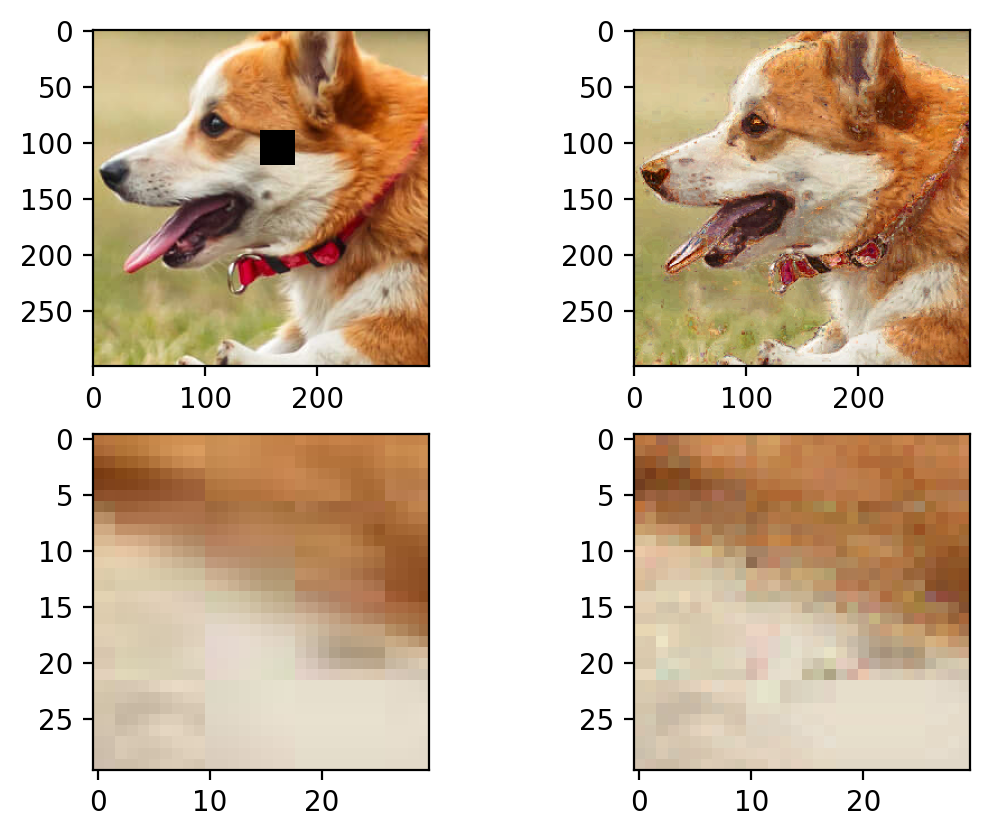

MSE for reconstruction :  tensor(0.0010)
PSNR for reconstruction :  tensor(58.8233)


In [19]:
# 1a RFF
patch_size = 30
# x_y_s = [[10,10],[90,150],[140,60]]
x_y_s = [[90,150]]
reconstructed_images_2 = []

for i in range(len(x_y_s)):
    print("Linear Regression + RFF for 30*30 rectangular patch")
    masked_img = mask_image_patch(original_img,x_y_s[i][0],x_y_s[i][1],3,patch_size)
    reconstructed_img = image_reconstrunction_linear_rff(masked_img,5000)
    mask = torch.isnan(masked_img)
    original_patch = original_img[mask].reshape(patch_size,patch_size,3)
    reconstructed_patch = reconstructed_img[mask].reshape(patch_size,patch_size,3)
    fig,axs = plt.subplots(2,2)
    axs[0][0].imshow(masked_img)
    axs[0][1].imshow(reconstructed_img)
    axs[1][0].imshow(original_patch)
    axs[1][1].imshow(reconstructed_patch)
    plt.show()
    print("MSE for reconstruction : ",mse(original_patch, reconstructed_patch))
    print("PSNR for reconstruction : ",psnr(original_patch, reconstructed_patch))

Random Missing pixels MF


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


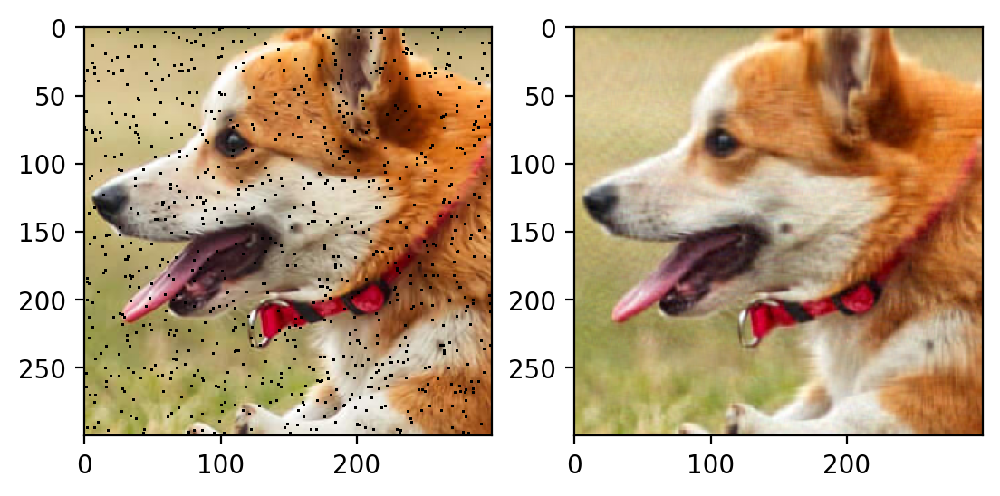

MSE for reconstruction :  tensor(0.0006)
PSNR for reconstruction :  tensor(64.5721)


In [20]:
# 1b MF

patch_size = 30
titles = ["Random Missing pixels MF"]
reconstructed_images_3 = []

print(titles[0])
masked_img = mask_image_random(original_img, patch_size)
reconstructed_img = image_reconstrunction_matrix_factorization(masked_img,50)
reconstructed_images_3.append(reconstructed_img)
fig,axs = plt.subplots(1,2)
axs[0].imshow(masked_img)
axs[1].imshow(reconstructed_img)
plt.show()
print("MSE for reconstruction : ",mse(original_img, reconstructed_img))
print("PSNR for reconstruction : ",psnr(original_img, reconstructed_img))

Random Missing pixels RFF


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


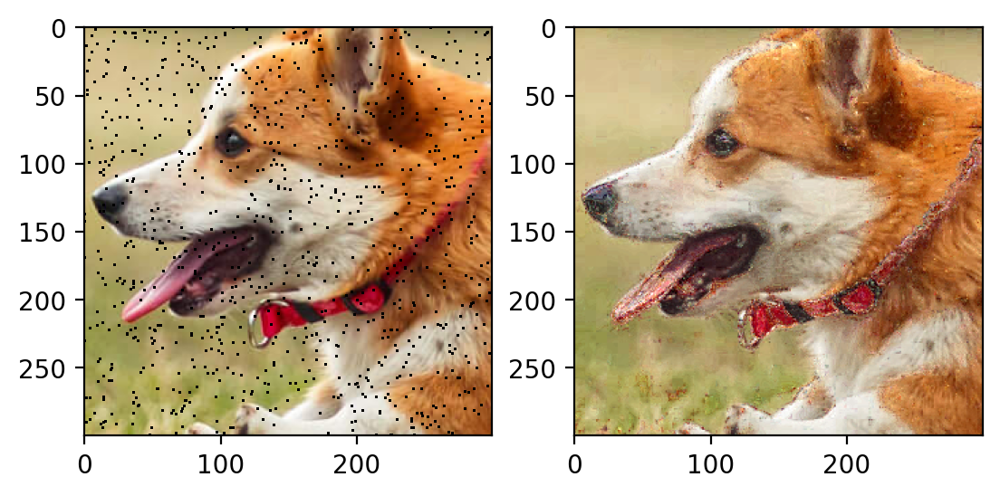

MSE for reconstruction :  tensor(0.0040)
PSNR for reconstruction :  tensor(48.0175)


In [23]:
# 1b RFF
patch_size = 30
titles = ["Random Missing pixels RFF"]
reconstructed_images_4 = []

print(titles[0])
masked_img = mask_image_random(original_img, patch_size)
reconstructed_img = image_reconstrunction_linear_rff(masked_img,8000)
reconstructed_images_4.append(reconstructed_img)
fig,axs = plt.subplots(1,2)
axs[0].imshow(masked_img)
axs[1].imshow(reconstructed_img)
plt.show()
print("MSE for reconstruction : ",mse(original_img, reconstructed_img))
print("PSNR for reconstruction : ",psnr(original_img, reconstructed_img))

We can see, we get better reconstruction using Linear Regression than Matrix Factorization

---------------------------
Patch Size  : 20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


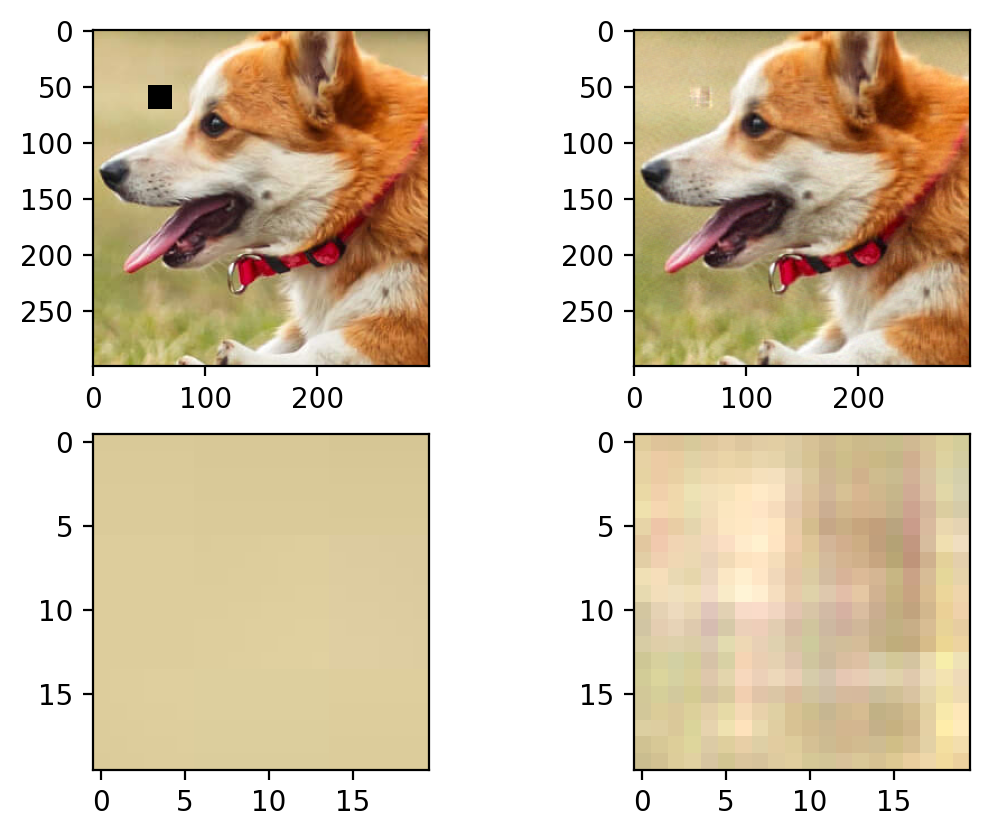

MSE for reconstruction :  tensor(0.0003)
PSNR for reconstruction :  tensor(70.2385)
---------------------------
---------------------------
Patch Size  : 40


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


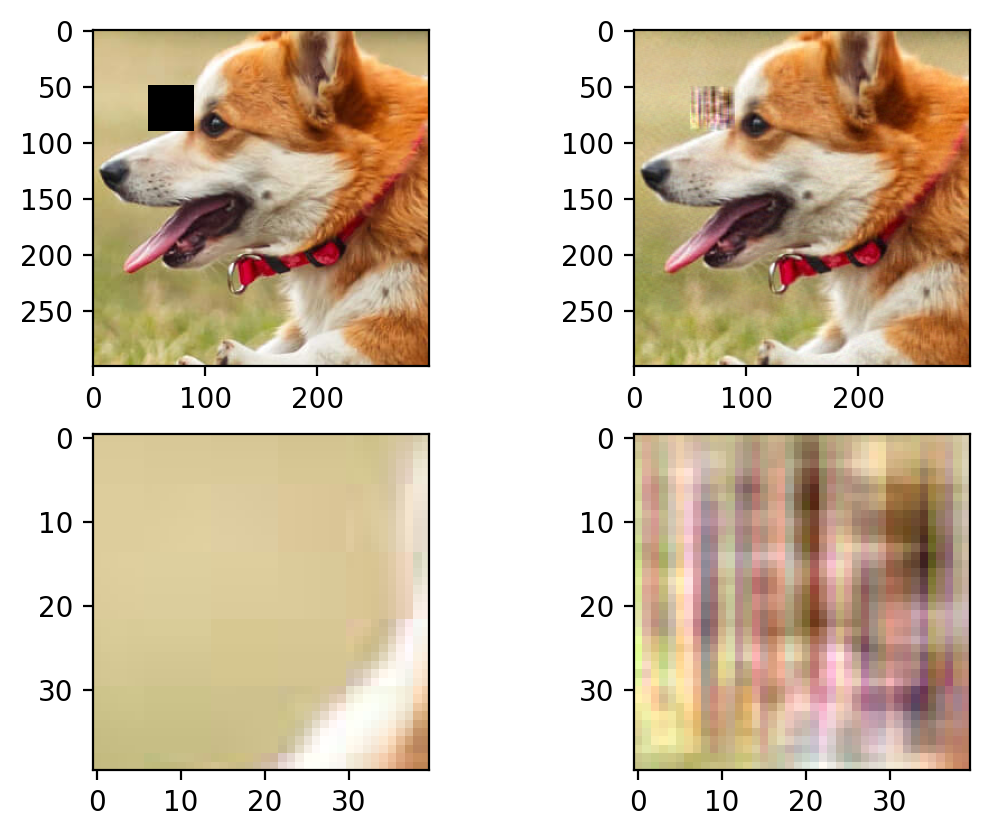

MSE for reconstruction :  tensor(0.0011)
PSNR for reconstruction :  tensor(59.5371)
---------------------------
---------------------------
Patch Size  : 60


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


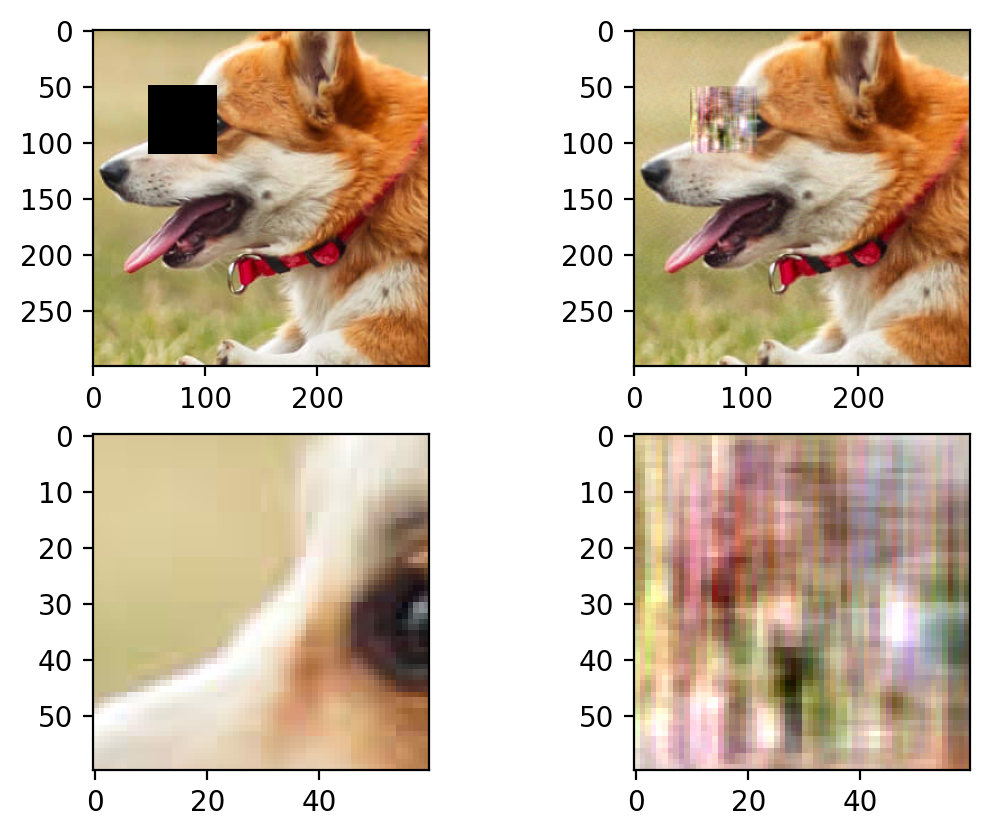

MSE for reconstruction :  tensor(0.0029)
PSNR for reconstruction :  tensor(50.8292)
---------------------------
---------------------------
Patch Size  : 80


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


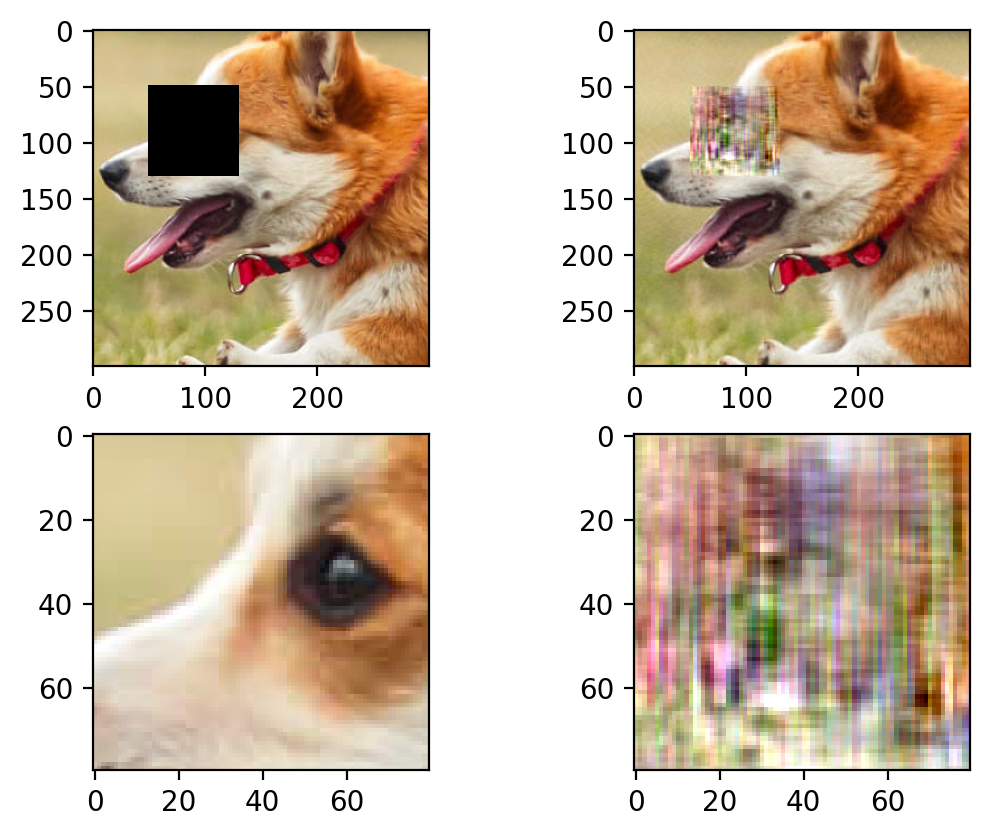

MSE for reconstruction :  tensor(0.0047)
PSNR for reconstruction :  tensor(46.6439)
---------------------------
---------------------------
Patch Size  : 100


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


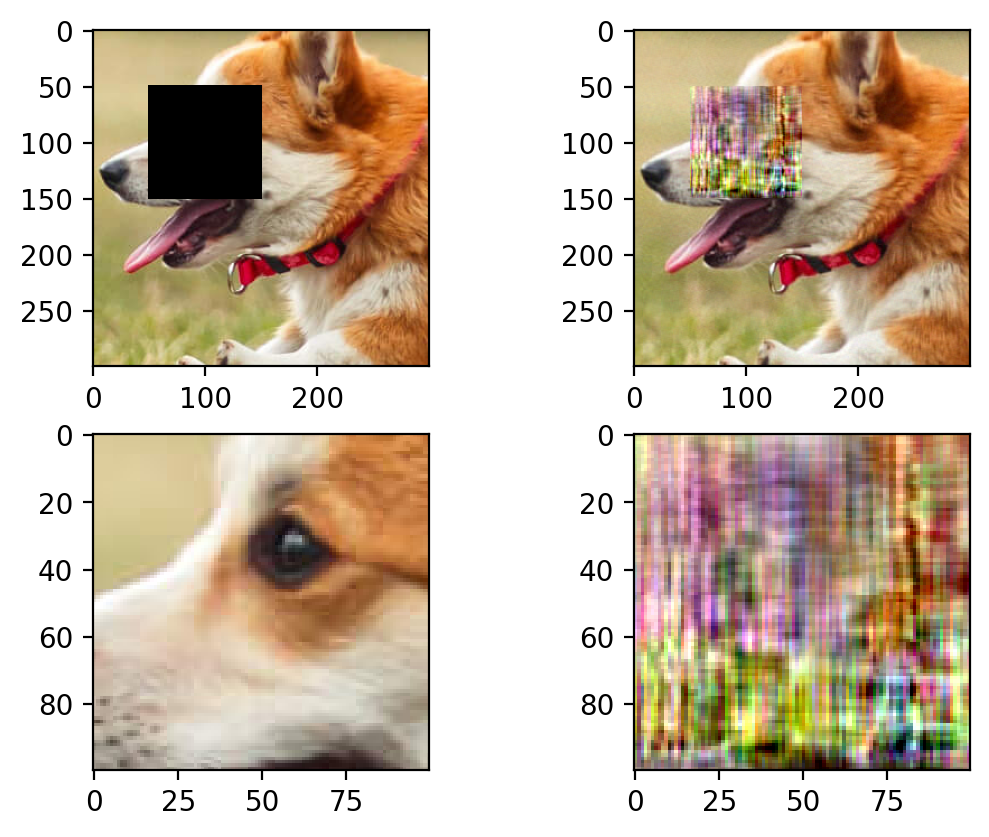

MSE for reconstruction :  tensor(0.0083)
PSNR for reconstruction :  tensor(41.6607)
---------------------------
---------------------------
---------------------------


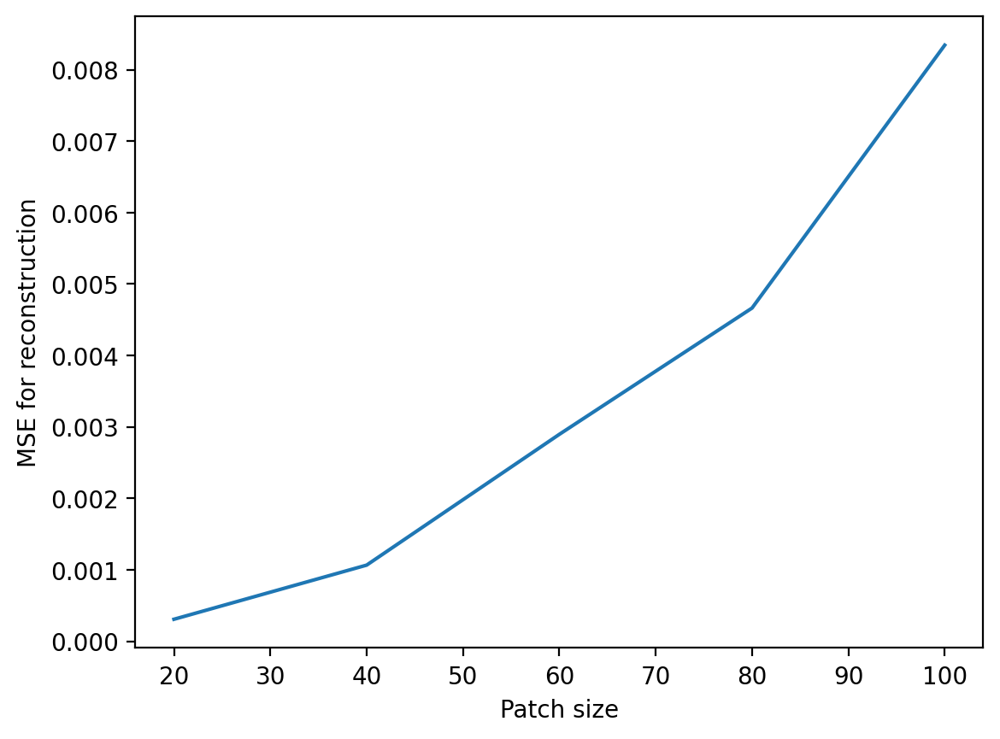

In [24]:
# 2a MF

x_start = 50
y_start = 50
patch_sizes = [20,40,60,80,100]
reconstructed_images_5 = []
mses= []
psnrs = []

for i in range(len(patch_sizes)):
    print("---------------------------")
    print(f"Patch Size  : {patch_sizes[i]}")
    patch_size = patch_sizes[i]
    masked_img = mask_image_patch(original_img,x_start,y_start,3,patch_sizes[i])
    reconstructed_img = image_reconstrunction_matrix_factorization(masked_img,100)
    reconstructed_images_5.append(reconstructed_img)
    mask = torch.isnan(masked_img)
    fig,axs = plt.subplots(2,2)
    axs[0][0].imshow(masked_img)
    axs[0][1].imshow(reconstructed_img)
    axs[1][0].imshow(original_img[mask].reshape(patch_size,patch_size,3))
    axs[1][1].imshow(reconstructed_img[mask].reshape(patch_size,patch_size,3))
    plt.show()
    ms = mse(original_img, reconstructed_img)
    ps = psnr(original_img, reconstructed_img)
    mses.append(ms)
    psnrs.append(ps)
    print("MSE for reconstruction : ",ms)
    print("PSNR for reconstruction : ",ps)
    print("---------------------------")

print("---------------------------")
plt.plot(patch_sizes,mses)
plt.xlabel("Patch size")
plt.ylabel("MSE for reconstruction")
print("---------------------------")

---------------------------
Patch Size  : 20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


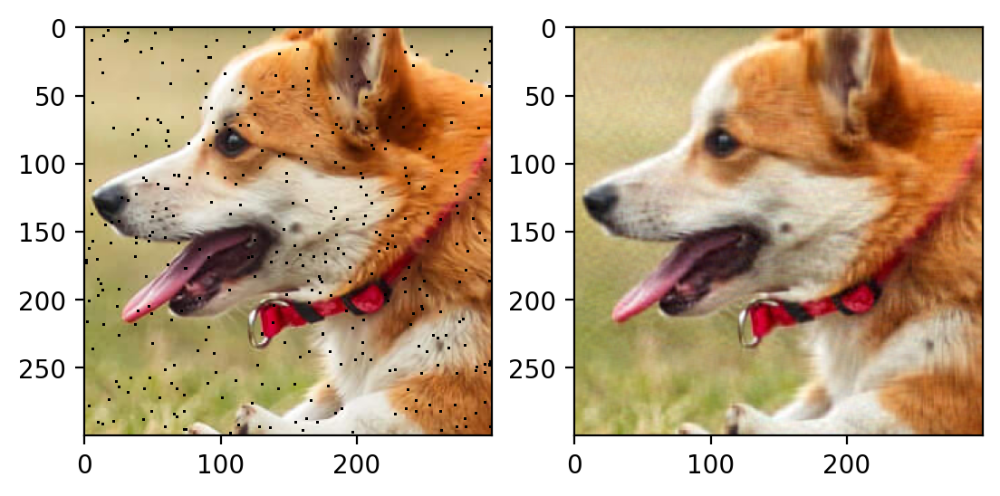

MSE for reconstruction :  tensor(0.0006)
PSNR for reconstruction :  tensor(64.8450)
---------------------------
---------------------------
Patch Size  : 40


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


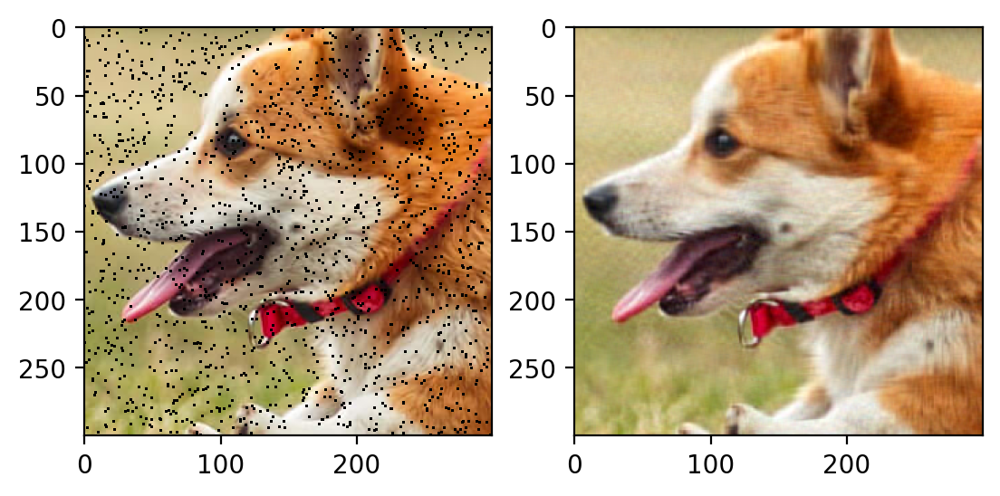

MSE for reconstruction :  tensor(0.0006)
PSNR for reconstruction :  tensor(64.6003)
---------------------------
---------------------------
Patch Size  : 60


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


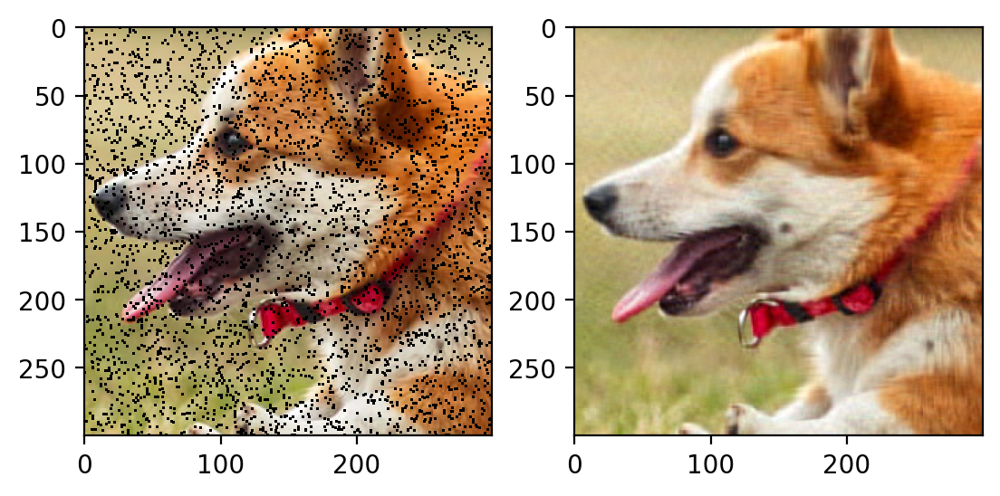

MSE for reconstruction :  tensor(0.0006)
PSNR for reconstruction :  tensor(64.4351)
---------------------------
---------------------------
Patch Size  : 80


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


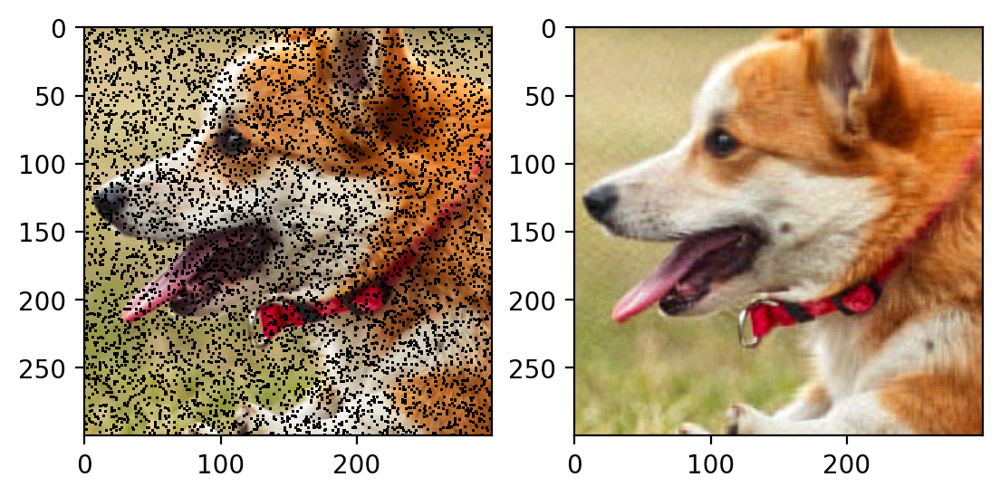

MSE for reconstruction :  tensor(0.0006)
PSNR for reconstruction :  tensor(64.5458)
---------------------------
---------------------------
Patch Size  : 100


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


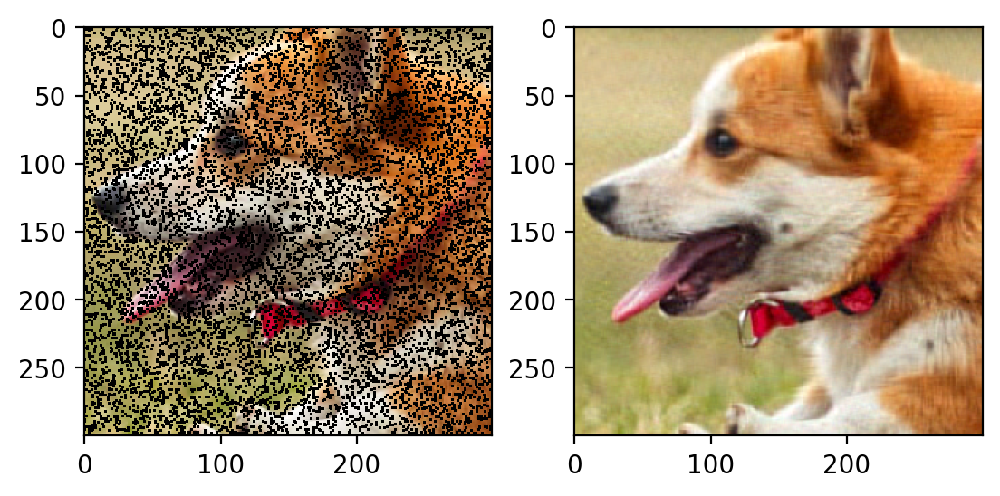

MSE for reconstruction :  tensor(0.0006)
PSNR for reconstruction :  tensor(64.1821)
---------------------------
---------------------------


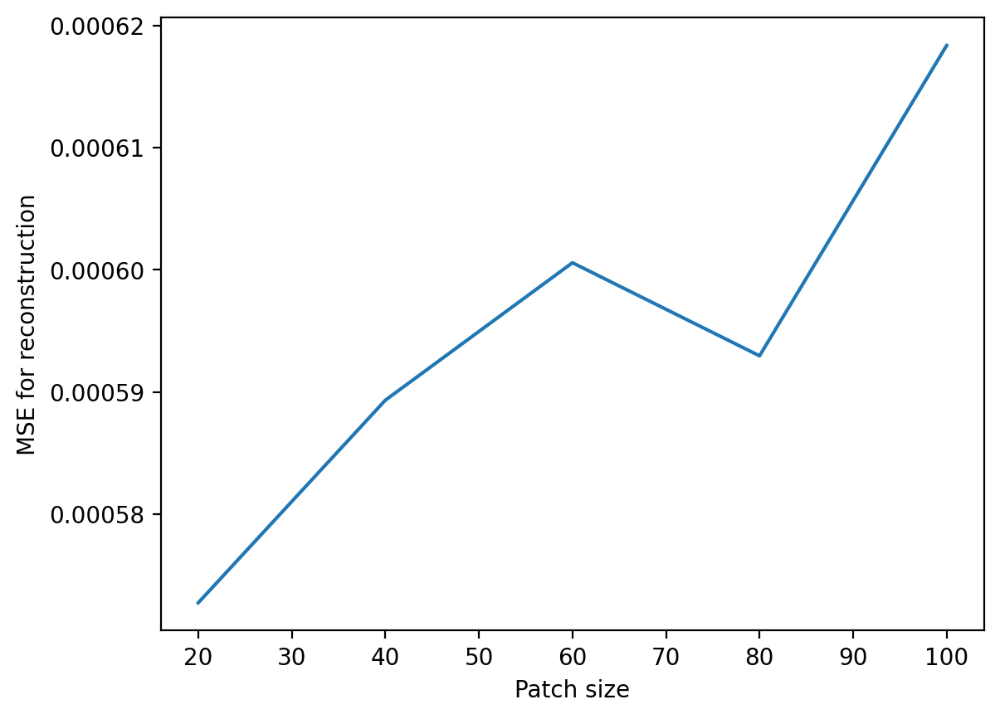

---------------------------


In [25]:
# 2b MF
x_start = 50
y_start = 50
# n1 = [30]
patch_sizes = [20,40,60,80,100]
reconstructed_images_6 = []
mses = []
psnrs = []

for i in range(len(patch_sizes)):
    print("---------------------------")
    print(f"Patch Size  : {patch_sizes[i]}")
    masked_img = mask_image_random(original_img,patch_sizes[i])
    reconstructed_img = image_reconstrunction_matrix_factorization(masked_img,50)
    reconstructed_images_6.append(reconstructed_img)
    fig,axs = plt.subplots(1,2)
    axs[0].imshow(masked_img)
    axs[1].imshow(reconstructed_img)
    plt.show()
    ms = mse(original_img, reconstructed_img)
    ps = psnr(original_img, reconstructed_img)
    mses.append(ms)
    psnrs.append(ps)
    print("MSE for reconstruction : ",ms)
    print("PSNR for reconstruction : ",ps)
    print("---------------------------")

print("---------------------------")
plt.plot(patch_sizes,mses)
plt.xlabel("Patch size")
plt.ylabel("MSE for reconstruction")
plt.show()
print("---------------------------")

Data Compression Reconstructions

---------------------------
A. 1 color patch
r :  5


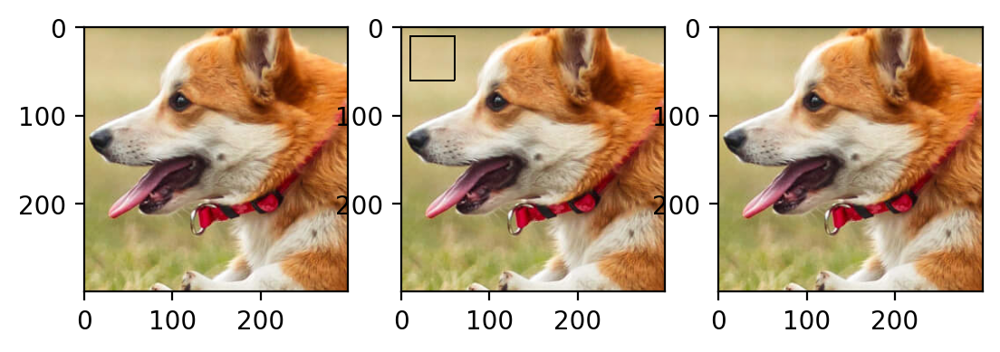

MSE for reconstruction :  tensor(7.9811e-06)
PSNR for reconstruction :  tensor(99.6888)
r :  10


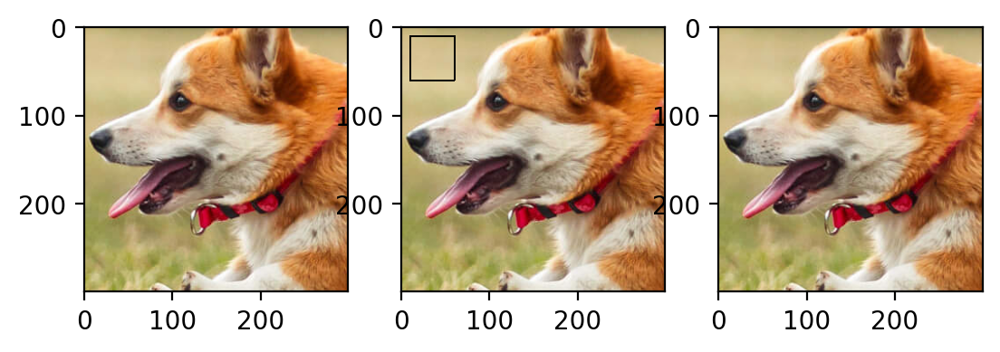

MSE for reconstruction :  tensor(5.2895e-06)
PSNR for reconstruction :  tensor(103.1386)
r :  25


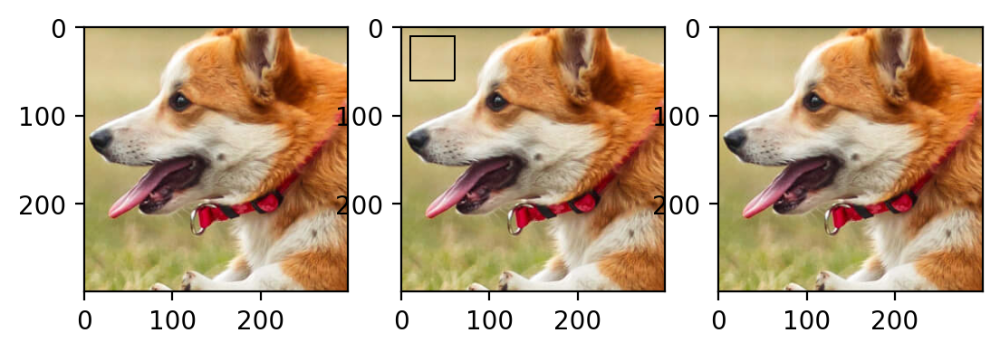

MSE for reconstruction :  tensor(7.7394e-06)
PSNR for reconstruction :  tensor(99.8692)
r :  50


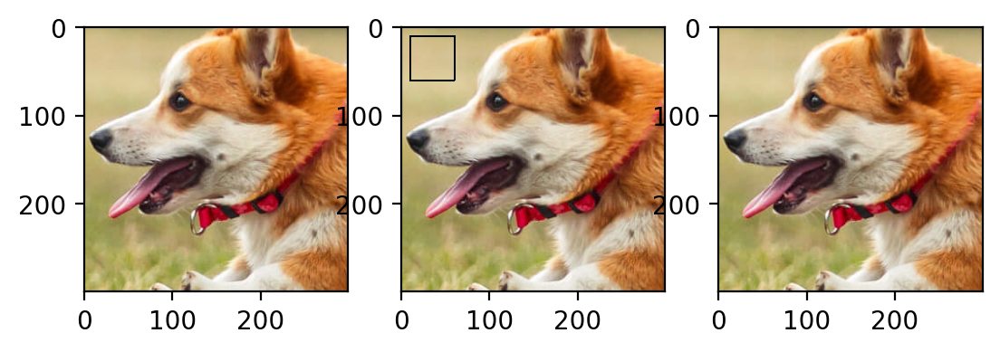

MSE for reconstruction :  tensor(1.1712e-05)
PSNR for reconstruction :  tensor(96.3133)
---------------------------
---------------------------
B. 2 color patch
r :  5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


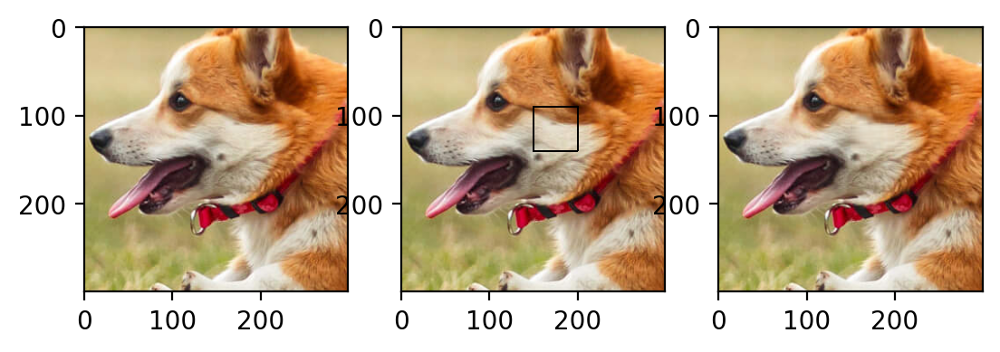

MSE for reconstruction :  tensor(0.0005)
PSNR for reconstruction :  tensor(65.8532)
r :  10


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


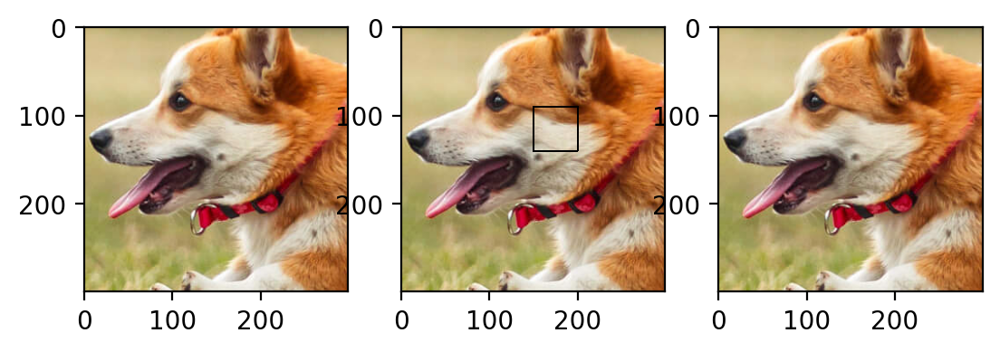

MSE for reconstruction :  tensor(0.0001)
PSNR for reconstruction :  tensor(76.9812)
r :  25


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


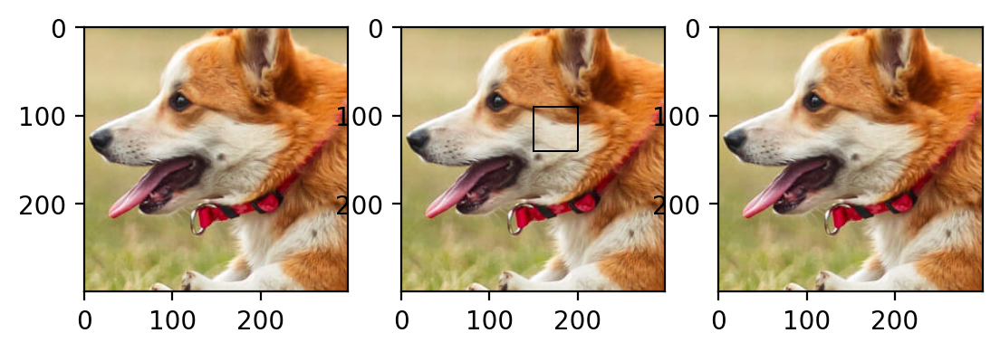

MSE for reconstruction :  tensor(2.3466e-05)
PSNR for reconstruction :  tensor(91.5366)
r :  50


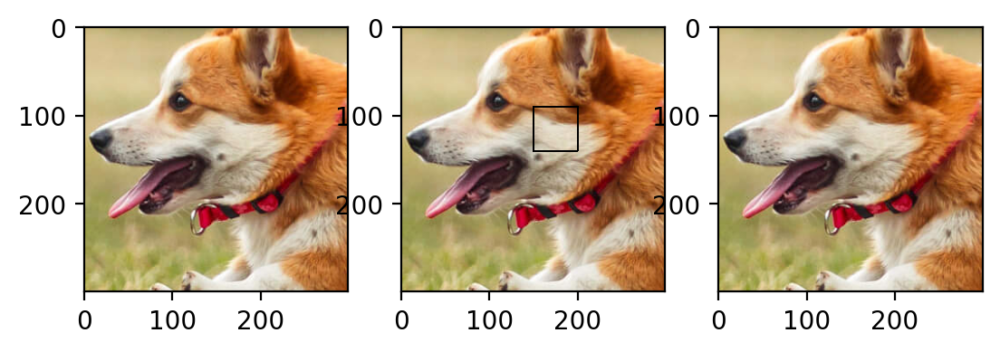

MSE for reconstruction :  tensor(1.6870e-05)
PSNR for reconstruction :  tensor(94.4309)
---------------------------
---------------------------
C. 5 color patch
r :  5


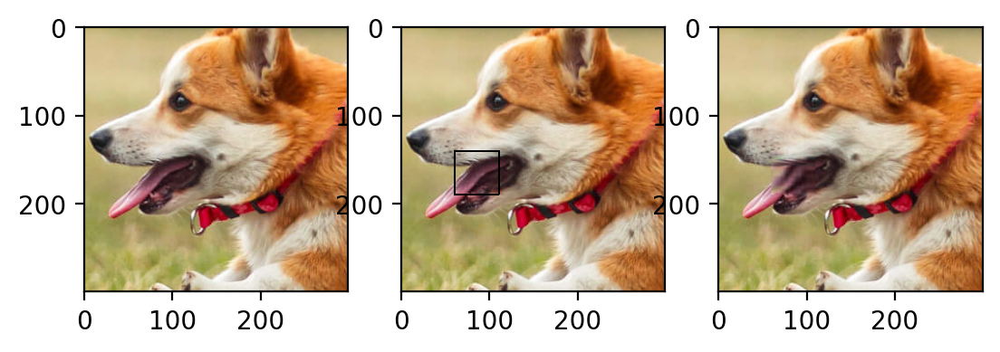

MSE for reconstruction :  tensor(0.0026)
PSNR for reconstruction :  tensor(50.8036)
r :  10


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


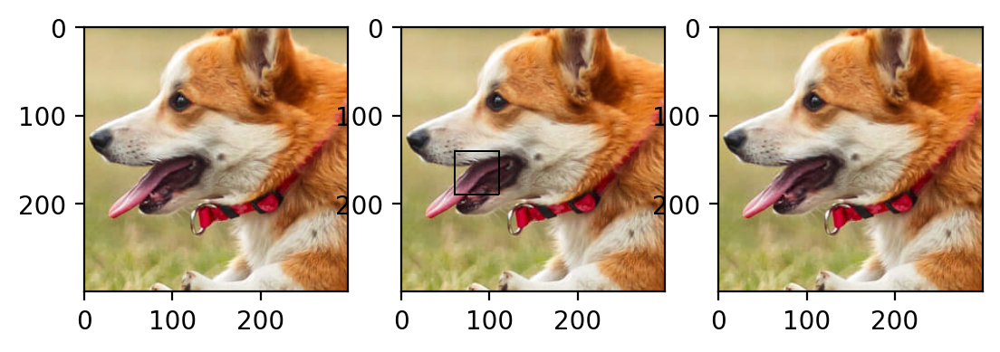

MSE for reconstruction :  tensor(0.0008)
PSNR for reconstruction :  tensor(60.5927)
r :  25


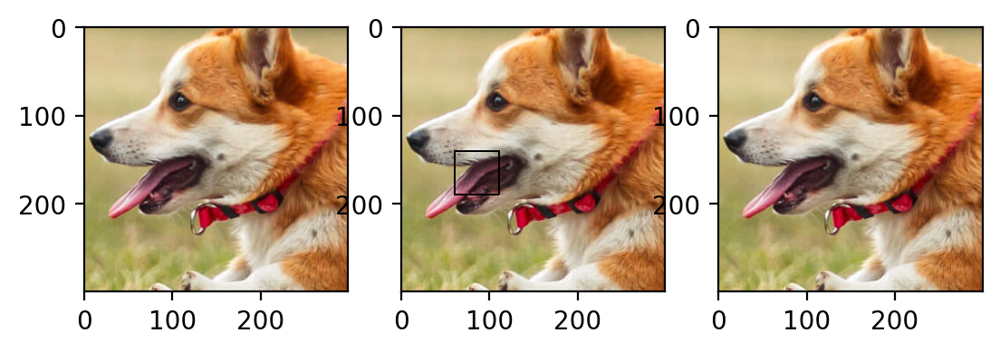

MSE for reconstruction :  tensor(3.5390e-05)
PSNR for reconstruction :  tensor(88.0856)
r :  50


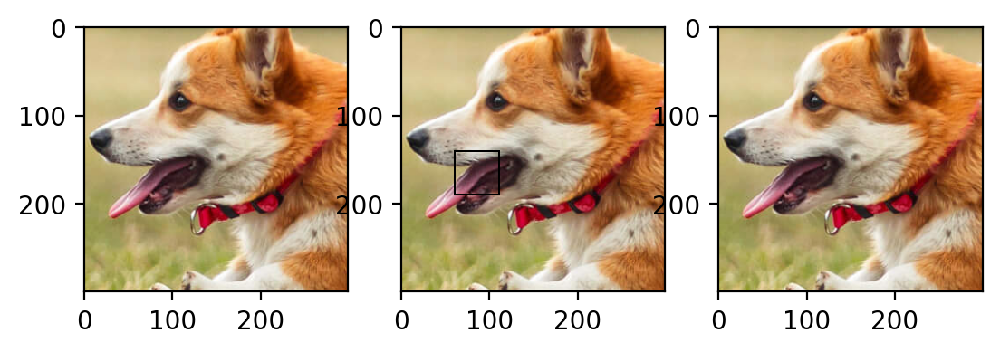

MSE for reconstruction :  tensor(1.2148e-05)
PSNR for reconstruction :  tensor(97.3750)
---------------------------


In [26]:
patch_size = 50
x_y_s = [[10,10],[90,150],[140,60]]
rs = [5, 10, 25, 50]
titles = ["A. 1 color patch", "B. 2 color patch", "C. 5 color patch"]

def border_patch(original_img,x,y,patch_size):
    bordered_img = original_img.clone()
    for i in range(patch_size):
        for k in range(3):
            bordered_img[x+i][y][k] = torch.nan 
            bordered_img[x+i][y+patch_size][k] = torch.nan 

    for j in range(patch_size):
        for k in range(3):
            bordered_img[x][y+j][k] = torch.nan 
            bordered_img[x+patch_size][y+j][k] = torch.nan 

    return bordered_img

mses = np.empty((len(x_y_s),len(rs)))
pses = np.empty((len(x_y_s),len(rs)))

for i in range(len(x_y_s)):
    print("---------------------------")
    print(titles[i])
    for j in range(len(rs)):
        print("r : ",rs[j])
        mask = create_mask(original_img, x_y_s[i][0], x_y_s[i][1],patch_size)
        img_patch = original_img[~mask].reshape(patch_size,patch_size,3)
        reconstructed_img_patch  = image_reconstrunction_matrix_factorization(img_patch,rs[j])
        reconstructed_img = fill_patch(original_img,reconstructed_img_patch,x_y_s[i][0],x_y_s[i][1],patch_size)
        fig,axs = plt.subplots(1,3)
        axs[0].imshow(original_img)
        axs[1].imshow(border_patch(original_img,x_y_s[i][0],x_y_s[i][1],patch_size))
        axs[2].imshow(reconstructed_img)
        plt.show()
        ms = mse(img_patch, reconstructed_img_patch)
        ps = psnr(img_patch, reconstructed_img_patch)
        print("MSE for reconstruction : ",ms)
        print("PSNR for reconstruction : ",ps)
        mses[i][j] = ms
        pses[i][j] = ps
    print("---------------------------")


In [27]:
print("MSE for Different Cases")
mse_dataframe = pd.DataFrame(mses,index = ['1 color','2 colors','5 colors'],columns = rs)
mse_dataframe

MSE for Different Cases


,5,10,25,50
1 color,0.000008,0.000005,0.000008,0.000012
2 colors,0.000451,0.000126,0.000023,0.000017
5 colors,0.002596,0.000838,0.000035,0.000012


In [29]:
print("PSNR for Different Cases")
mse_dataframe = pd.DataFrame(pses,index = ['1 color','2 colors','5 colors'],columns = rs)
mse_dataframe

PSNR for Different Cases


,5,10,25,50
1 color,99.688812,103.138641,99.869202,96.313316
2 colors,65.853249,76.981239,91.536613,94.430878
5 colors,50.803577,60.592693,88.085579,97.374969
